# Generating Flowers using a Diffusion Model based on UNET

----
- **Chosen Paper:** [Diffusion Models Beat GANs on Image Synthesis [Dhariwal, Nichol, 2021]](https://openreview.net/pdf?id=AAWuCvzaVt)
- **Published at:** NeurIPS21
- **Reason for selection:** The reason for choosing this paper is because it had a big impact on how images are generated. The study showed that a diffusion model can produce better results than Generative Adversarial Networks (GANs). This discovery led to a significant change in how researchers approach image generation. By demonstrating better performance in creating images, the paper questioned the dominance of GANs, which have been the main method for making realistic images. This change not only drew a lot of interest from academics but also encouraged more study into diffusion models and how they could be used in different areas besides image generation. Overall, the paper provides important insights and has sparked new ideas for research in visual media and artificial intelligence.


----------
**Other Sources:**
- Used Dataset ([102 Category Flower Dataset](https://www.robots.ox.ac.uk/~vgg/data/flowers/102/))
- Used Tutorials ([Diffusion Models - Live Coding Tutorial](https://youtu.be/S_il77Ttrmg),[Diffusion models from scratch in PyTorch](https://www.youtube.com/watch?v=a4Yfz2FxXiY))
- Used Repositories ([Denoising Diffusion Pytorch](https://github.com/lucidrains/denoising-diffusion-pytorch), [The Annotated Diffusion Model](https://colab.research.google.com/github/huggingface/notebooks/blob/main/examples/annotated_diffusion.ipynb#scrollTo=3a159023), [Diffusion Model](https://colab.research.google.com/drive/1sjy9odlSSy0RBVgMTgP7s99NXsqglsUL?usp=sharing))

-------
**Modification Overview:**
- Dataset Change: Updated to the 102Flower Dataset.
- Code Adjustments and Comments: Made specific changes to improve code efficiency, readability, and maintainability, while adding explanatory comments.
- Changed Order and Structure of Code Blocks: Reorganized code blocks to enhance logical flow.
- Tested Different Hyperparameters: Experimented with various hyperparameters to find optimal settings.
- Added Weight Saving and Resuming Mechanism: Implemented functionality to save model weights periodically during training and resume training from the saved checkpoint if interrupted.

--------

# Setup

## Imports

In [1]:
import os
import math
import numpy as np
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.optim import Adam
from torch.utils.data import DataLoader

import torchvision
from torchvision import transforms

from google.colab import files

## Dataset

The used dataset is the 102 Category Flower by the Department of Engineering Science at University of Oxford.

100%|██████████| 344862509/344862509 [00:21<00:00, 16339285.45it/s]


Extracting flowers-102/102flowers.tgz to flowers-102


100%|██████████| 502/502 [00:00<00:00, 775235.86it/s]


100%|██████████| 14989/14989 [00:00<00:00, 21761309.33it/s]


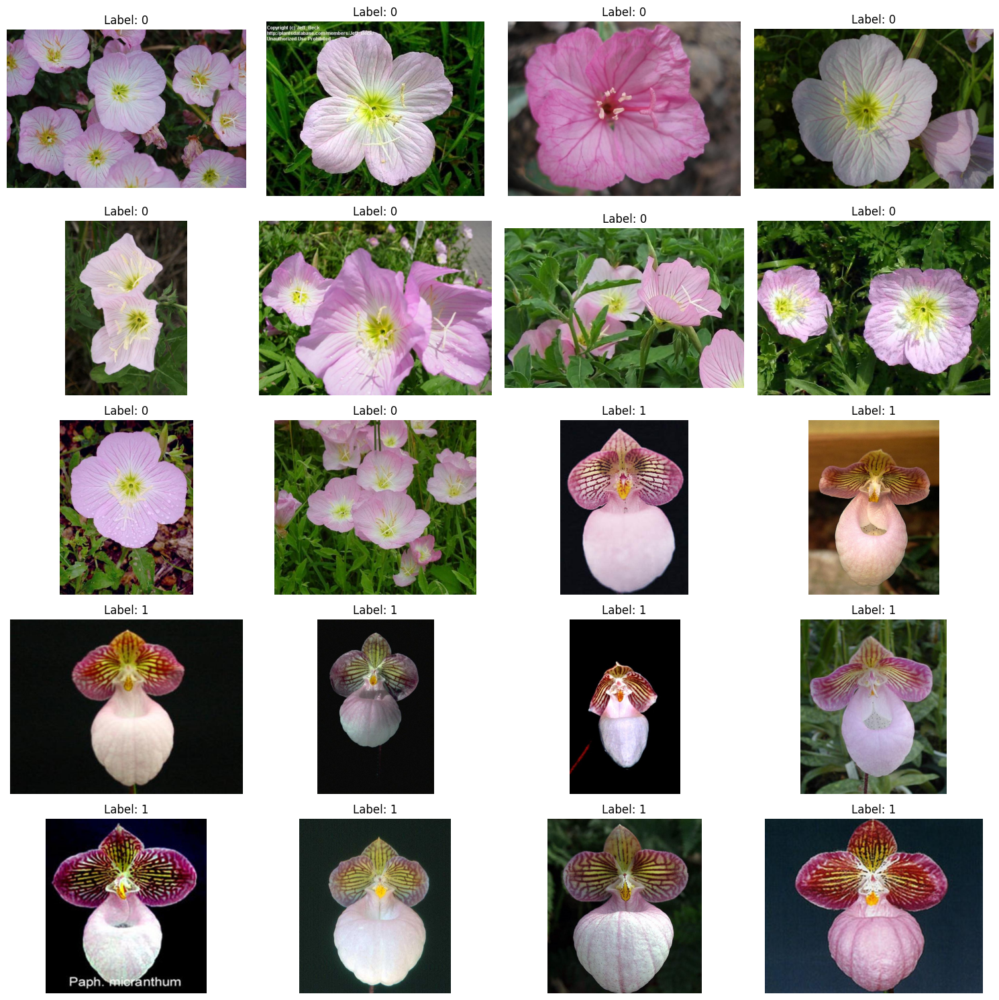

In [2]:
def show_images(dataset, num_samples=20, cols=4):
    """Plots some samples from the dataset."""

    #Set the figure size
    plt.figure(figsize=(15,15))

    # Calculate the number of rows needed
    rows = (num_samples + cols - 1) // cols

    # Loop through the dataset to plot images
    for i in range(num_samples):
        # Break the loop if the index exceeds the dataset length
        if i >= len(dataset):
            break

        # Get the image and label from the dataset
        img, label = dataset[i]
        img = img.permute(1, 2, 0)  # Convert from CxHxW to HxWxC
        plt.subplot(rows, cols, i + 1)
        plt.imshow(img) #Display the image
        plt.title(f'Label: {label}')
        plt.axis('off')
    plt.tight_layout()
    plt.show()

# Download the dataset
data = torchvision.datasets.Flowers102(root="./", download=True, transform=torchvision.transforms.ToTensor())

# Show images from the dataset
show_images(data)


# Image (Pre-)Processing

## Step 1: The forward process = Noise scheduler




This section shows the forward process of a noise scheduler diffusion model. It examines the incremental addition of noise to images, simulating the diffusion process.

Note: Read the image from **left to right**. Noise gets added.

In [3]:
IMG_SIZE = 64
BATCH_SIZE = 128
T = 300  # Number of timesteps for diffusion
device = "cuda" if torch.cuda.is_available() else "cpu"  # Device for computations

In [4]:
def load_transformed_dataset():
    """
    Loads and transforms the image dataset.
    Returns a concatenated dataset of train and test splits.
    """
    data_transforms = transforms.Compose([
        transforms.Resize((IMG_SIZE, IMG_SIZE)),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),  # Scales data into [0,1]
        transforms.Lambda(lambda t: (t * 2) - 1)  # Scale between [-1, 1]
    ])

    train_dataset = torchvision.datasets.Flowers102(root="./", download=True, transform=data_transforms)
    test_dataset = torchvision.datasets.Flowers102(root="./", download=True, transform=data_transforms, split='test')

    return torch.utils.data.ConcatDataset([train_dataset, test_dataset])

def show_tensor_image(image):
    """
    Displays a tensor image.
    """
    reverse_transforms = transforms.Compose([
        transforms.Lambda(lambda t: (t + 1) / 2),  # Scale back to [0, 1]
        transforms.Lambda(lambda t: t.permute(1, 2, 0)),  # CHW to HWC
        transforms.Lambda(lambda t: t * 255.),  # Scale to [0, 255]
        transforms.Lambda(lambda t: t.numpy().astype(np.uint8)),  # Convert to uint8
        transforms.ToPILImage()  # Convert to PIL Image
    ])

    # Take the first image of the batch if batch dimension exists
    if len(image.shape) == 4:
        image = image[0]

    plt.imshow(reverse_transforms(image))
    plt.axis('off')

def linear_beta_schedule(timesteps, start=0.0001, end=0.02):
    """
    Returns a linear schedule of betas from start to end over the given timesteps.
    """
    return torch.linspace(start, end, timesteps)

def get_index_from_list(vals, t, x_shape):
    """
    Returns a specific index t from a list of values vals
    while considering the batch dimension.
    """
    batch_size = t.shape[0] # Get the batch size from the shape of t
    out = vals.gather(-1, t.cpu()) #Gather values from vals at the indices specified by t
    return out.reshape(batch_size, *((1,) * (len(x_shape) - 1))).to(t.device) # Reshape the output to match the batch size and the shape of x


def forward_diffusion_sample(x_0, t, device="cpu"):
    """
    Takes an image and a timestep as input and returns the noisy version of it.
    """
    noise = torch.randn_like(x_0) # Generate random noise with the same shape as the input image
    sqrt_alphas_cumprod_t = get_index_from_list(sqrt_alphas_cumprod, t, x_0.shape)
    sqrt_one_minus_alphas_cumprod_t = get_index_from_list(sqrt_one_minus_alphas_cumprod, t, x_0.shape)
    # mean + variance
    noisy_image = sqrt_alphas_cumprod_t.to(device) * x_0.to(device) + sqrt_one_minus_alphas_cumprod_t.to(device) * noise.to(device)
    return noisy_image, noise # Return the noisy image and the noise used to create it

<ipython-input-5-f712aea0b966>:27: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, num_images+1, int(idx/stepsize) + 1)


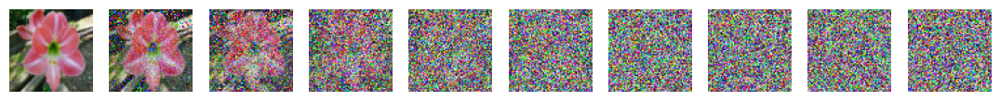

In [5]:
# Define beta schedule
betas = linear_beta_schedule(timesteps=T)

# Pre-calculate different terms for closed form
alphas = 1. - betas
alphas_cumprod = torch.cumprod(alphas, dim=0)
alphas_cumprod_prev = F.pad(alphas_cumprod[:-1], (1, 0), value=1.0)
sqrt_recip_alphas = torch.sqrt(1.0 / alphas)
sqrt_alphas_cumprod = torch.sqrt(alphas_cumprod)
sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - alphas_cumprod)
posterior_variance = betas * (1. - alphas_cumprod_prev) / (1. - alphas_cumprod)

# Load dataset and create dataloader
data = load_transformed_dataset()
dataloader = DataLoader(data, batch_size=BATCH_SIZE, shuffle=True, drop_last=True)

# Simulate forward diffusion
image = next(iter(dataloader))[0]

# Plot image
plt.figure(figsize=(15,15))
plt.axis('off')
num_images = 10
stepsize = int(T/num_images)

for idx in range(0, T, stepsize):
    t = torch.Tensor([idx]).type(torch.int64)
    plt.subplot(1, num_images+1, int(idx/stepsize) + 1)
    img, noise = forward_diffusion_sample(image, t)
    show_tensor_image(img)

## Step 2: The Diffusion Model / UNet

This section focuses on the diffusion model, specifically the [UNet architecture](https://en.wikipedia.org/wiki/U-Net#/media/File:Example_architecture_of_U-Net_for_producing_k_256-by-256_image_masks_for_a_256-by-256_RGB_image.png). It provides an in-depth analysis of how the model processes and denoises data through successive stages. This step is pivotal for the model's capability to reconstruct and generate high-quality outputs from noisy inputs.

In [6]:
from torch import nn
import math

# Define a custom block module which can act as either a downsampling or upsampling block in the U-Net architecture
class Block(nn.Module):
    def __init__(self, in_ch, out_ch, time_emb_dim, up=False):
        super().__init__()
        # Linear layer to embed the time information
        self.time_mlp =  nn.Linear(time_emb_dim, out_ch)
        if up:
            # If upsampling, use a Conv2d followed by a ConvTranspose2d for upsampling
            self.conv1 = nn.Conv2d(2*in_ch, out_ch, 3, padding=1)
            self.transform = nn.ConvTranspose2d(out_ch, out_ch, 4, 2, 1)
        else:
            # If downsampling, use two Conv2d layers
            self.conv1 = nn.Conv2d(in_ch, out_ch, 3, padding=1)
            self.transform = nn.Conv2d(out_ch, out_ch, 4, 2, 1)
        self.conv2 = nn.Conv2d(out_ch, out_ch, 3, padding=1)
        # Batch normalization layers
        self.bnorm1 = nn.BatchNorm2d(out_ch)
        self.bnorm2 = nn.BatchNorm2d(out_ch)
        # ReLU activation function
        self.relu  = nn.ReLU()

    def forward(self, x, t, ):
        # Apply first convolution, batch norm, and ReLU
        h = self.bnorm1(self.relu(self.conv1(x)))
        # Embed time information and extend dimensions to match spatial dimensions
        time_emb = self.relu(self.time_mlp(t))
        time_emb = time_emb[(..., ) + (None, ) * 2]
        # Add time embedding to feature map
        h = h + time_emb
        # Apply second convolution, batch norm, and ReLU
        h = self.bnorm2(self.relu(self.conv2(h)))
        # Perform transformation (either upsampling or downsampling)
        return self.transform(h)

# Sinusoidal positional embedding for the time steps
class SinusoidalPositionEmbeddings(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, time):
        device = time.device
        half_dim = self.dim // 2
        embeddings = math.log(10000) / (half_dim - 1)
        embeddings = torch.exp(torch.arange(half_dim, device=device) * -embeddings)
        embeddings = time[:, None] * embeddings[None, :]
        embeddings = torch.cat((embeddings.sin(), embeddings.cos()), dim=-1)
        return embeddings

# Simple U-Net architecture
class SimpleUnet(nn.Module):
    """
    A simplified variant of the Unet architecture.
    """
    def __init__(self):
        super().__init__()
        image_channels = 3
        down_channels = (64, 128, 256, 512, 1024)
        up_channels = (1024, 512, 256, 128, 64)
        out_dim = 3
        time_emb_dim = 32

        # Time embedding using sinusoidal embeddings followed by a linear layer and ReLU
        self.time_mlp = nn.Sequential(
                SinusoidalPositionEmbeddings(time_emb_dim),
                nn.Linear(time_emb_dim, time_emb_dim),
                nn.ReLU()
            )

        # Initial convolution layer
        self.conv0 = nn.Conv2d(image_channels, down_channels[0], 3, padding=1)

        # Downsampling layers
        self.downs = nn.ModuleList([Block(down_channels[i], down_channels[i+1], \
                                    time_emb_dim) \
                    for i in range(len(down_channels)-1)])

        # Upsampling layers
        self.ups = nn.ModuleList([Block(up_channels[i], up_channels[i+1], \
                                        time_emb_dim, up=True) \
                    for i in range(len(up_channels)-1)])

        # Output layer to map to the desired number of output channels
        self.output = nn.Conv2d(up_channels[-1], out_dim, 1)

    def forward(self, x, timestep):
        # Embed the time step
        t = self.time_mlp(timestep)
        # Apply initial convolution
        x = self.conv0(x)
        # Store residuals for skip connections
        residual_inputs = []
        for down in self.downs:
            x = down(x, t)
            residual_inputs.append(x)
        for up in self.ups:
            residual_x = residual_inputs.pop()
            # Concatenate the upsampled feature map with the corresponding residual
            x = torch.cat((x, residual_x), dim=1)
            x = up(x, t)
        return self.output(x)

# Instantiate the model and print the number of parameters
model = SimpleUnet()
print("Num params: ", sum(p.numel() for p in model.parameters()))
model

Num params:  62438883


SimpleUnet(
  (time_mlp): Sequential(
    (0): SinusoidalPositionEmbeddings()
    (1): Linear(in_features=32, out_features=32, bias=True)
    (2): ReLU()
  )
  (conv0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (downs): ModuleList(
    (0): Block(
      (time_mlp): Linear(in_features=32, out_features=128, bias=True)
      (conv1): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (transform): Conv2d(128, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bnorm1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (bnorm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU()
    )
    (1): Block(
      (time_mlp): Linear(in_features=32, out_features=256, bias=True)
      (conv1): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (transfor

## Step 3: The loss

In this step the loss function is defined, which is a crucial component in training the neural network.

In [7]:
def get_loss(model, x_0, t, device="cpu"):
    """
    Computes the loss for the given model, original image x_0, and timestep t.

    Args:
    - model (nn.Module): The model to evaluate.
    - x_0 (torch.Tensor): The original, clean images.
    - t (torch.Tensor): The timesteps at which to evaluate the model.
    - device (str): The device on which to perform computations ("cpu" or "cuda").

    Returns:
    - torch.Tensor: The computed L1 loss.
    """
    # Forward diffusion process to add noise
    x_noisy, noise = forward_diffusion_sample(x_0, t, device)

    # Predict the noise using the model
    noise_pred = model(x_noisy, t)

    # Compute the L1 loss between the actual noise and the predicted noise
    loss = F.l1_loss(noise, noise_pred)

    return loss


## Sampling


This section implements functions to iteratively denoise images across multiple timesteps and visualizes denoising progress through sequential image generation and plotting.

In [8]:
@torch.no_grad()
def sample_timestep(model, x, t):
    """
    Predicts the denoised image at timestep t.

    Args:
    - model (nn.Module): The model to use for noise prediction.
    - x (torch.Tensor): The noisy input image.
    - t (torch.Tensor): The current timestep.

    Returns:
    - torch.Tensor: The denoised image.
    """
    betas_t = get_index_from_list(betas, t, x.shape)
    sqrt_one_minus_alphas_cumprod_t = get_index_from_list(
        sqrt_one_minus_alphas_cumprod, t, x.shape
    )
    sqrt_recip_alphas_t = get_index_from_list(sqrt_recip_alphas, t, x.shape)

    # Model's prediction of the noise in the image
    model_mean = sqrt_recip_alphas_t * (
        x - betas_t * model(x, t) / sqrt_one_minus_alphas_cumprod_t
    )
    posterior_variance_t = get_index_from_list(posterior_variance, t, x.shape)

    if t.item() == 0:
        # If t == 0, return the model mean without adding noise
        return model_mean
    else:
        noise = torch.randn_like(x)
        return model_mean + torch.sqrt(posterior_variance_t) * noise

@torch.no_grad()
def sample_plot_image(model, device):
    """
    Generates and plots a series of images showing the denoising process.

    Args:
    - model (nn.Module): The model to use for noise prediction.
    - device (str or torch.device): The device to perform computations on.
    """
    img_size = IMG_SIZE
    img = torch.randn((1, 3, img_size, img_size), device=device)
    plt.figure(figsize=(15, 15))
    plt.axis('off')
    num_images = 10
    stepsize = int(T / num_images)

    for i in range(T - 1, -1, -1):
        t = torch.full((1,), i, device=device, dtype=torch.long)
        img = sample_timestep(model, img, t)
        img = torch.clamp(img, -1.0, 1.0)
        if i % stepsize == 0:
            plt.subplot(1, num_images, int(i / stepsize) + 1)
            show_tensor_image(img.detach().cpu())
    plt.show()


# Training

This section brings everything together to train the model.

**Note:**

*   Read the images from **right to left**: Out of random noise (on the right), a flower (on the left) is generated step by step.
*   Training was stopped due to limited computational resources after 540 epochs. Better results can be expected with more compute.



Pretrained weights file does not exist, new training started
Epoch 0 | Step 000 | Loss: 0.8095487356185913


<ipython-input-8-04412d4ff7b0>:54: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, num_images, int(i / stepsize) + 1)


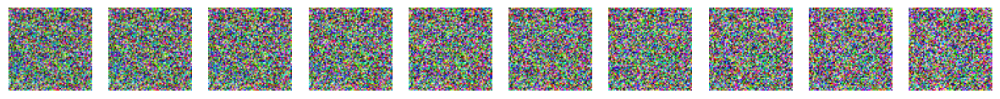

Epoch 15 | Step 000 | Loss: 0.16951124370098114


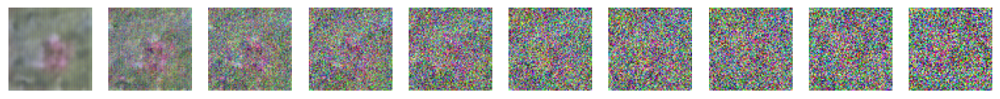

Epoch 30 | Step 000 | Loss: 0.15492293238639832


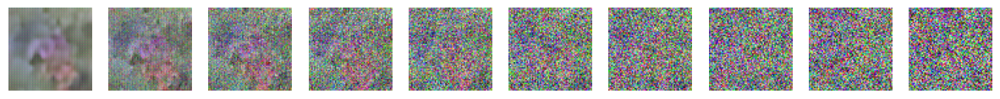

Epoch 45 | Step 000 | Loss: 0.17856411635875702


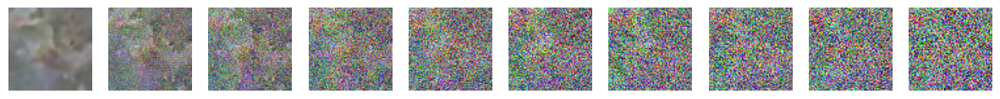

Epoch 60 | Step 000 | Loss: 0.15270152688026428


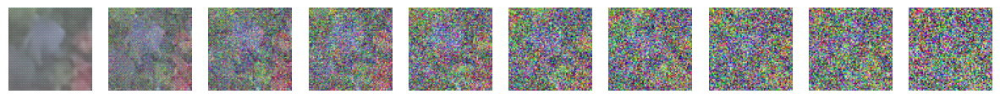

Epoch 75 | Step 000 | Loss: 0.15804791450500488


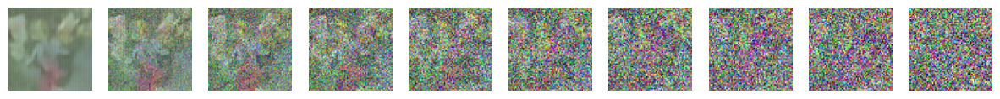

Epoch 90 | Step 000 | Loss: 0.14825493097305298


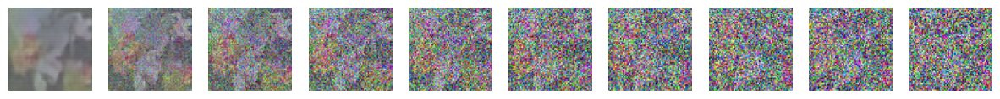

Epoch 105 | Step 000 | Loss: 0.13778553903102875


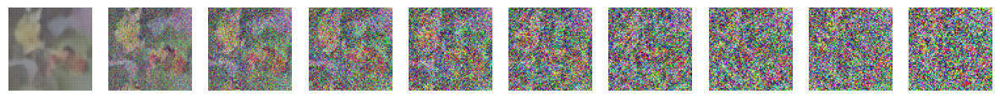

Epoch 120 | Step 000 | Loss: 0.14622512459754944


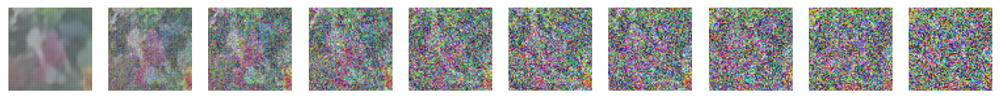

Epoch 135 | Step 000 | Loss: 0.1402505487203598


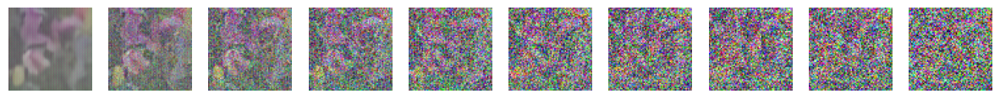

Epoch 150 | Step 000 | Loss: 0.16358205676078796


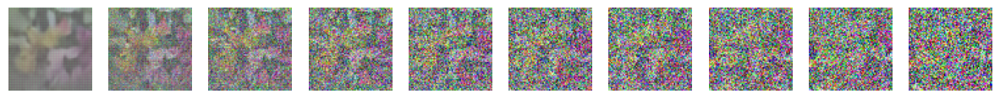

Epoch 165 | Step 000 | Loss: 0.16315914690494537


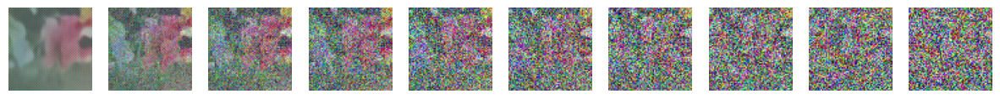

Epoch 180 | Step 000 | Loss: 0.14930668473243713


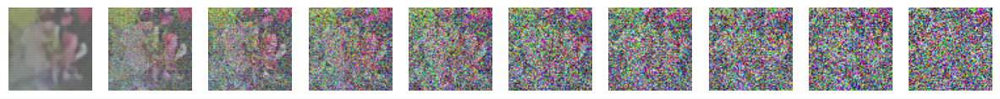

Epoch 195 | Step 000 | Loss: 0.13511338829994202


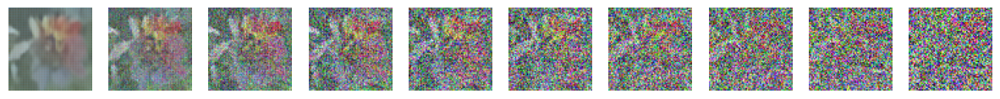

Epoch 210 | Step 000 | Loss: 0.1342800259590149


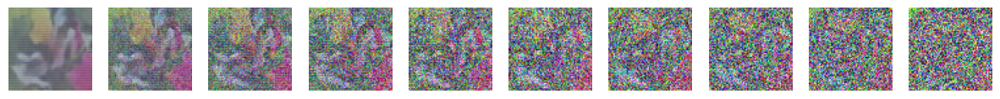

Epoch 225 | Step 000 | Loss: 0.1457277238368988


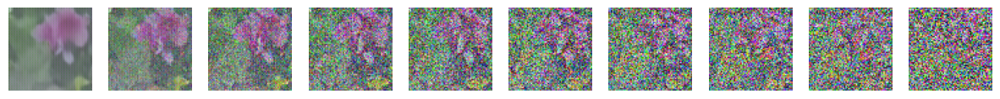

Epoch 240 | Step 000 | Loss: 0.15425923466682434


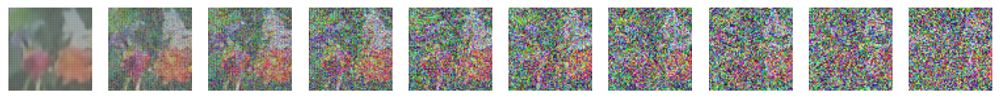

Epoch 255 | Step 000 | Loss: 0.14916828274726868


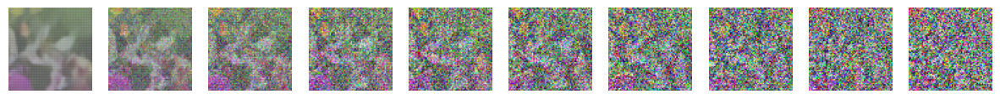

Epoch 270 | Step 000 | Loss: 0.1410852074623108


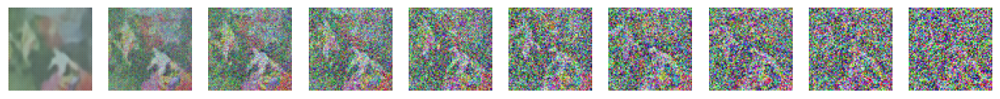

Epoch 285 | Step 000 | Loss: 0.14959949254989624


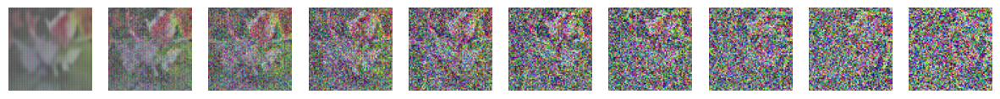

Epoch 300 | Step 000 | Loss: 0.1667647361755371


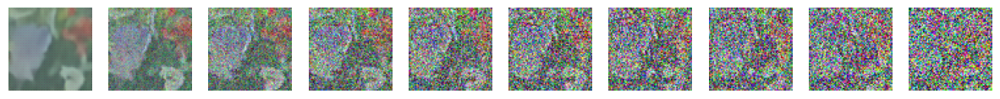

Epoch 315 | Step 000 | Loss: 0.13679449260234833


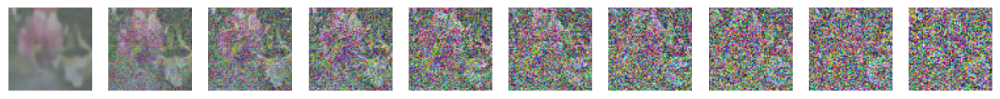

Epoch 330 | Step 000 | Loss: 0.1481723040342331


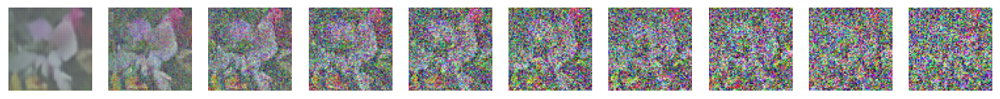

Epoch 345 | Step 000 | Loss: 0.13730786740779877


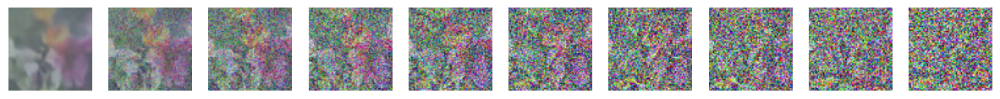

Epoch 360 | Step 000 | Loss: 0.14794281125068665


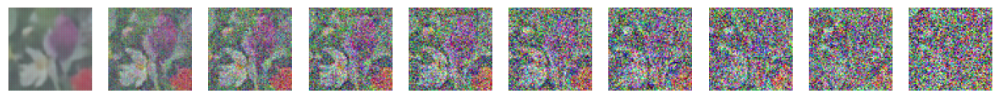

Epoch 375 | Step 000 | Loss: 0.14775186777114868


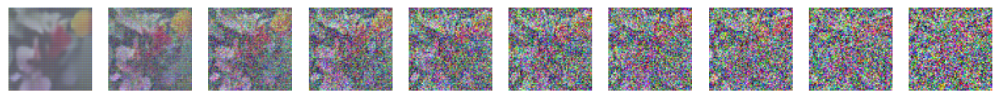

Epoch 390 | Step 000 | Loss: 0.1559601128101349


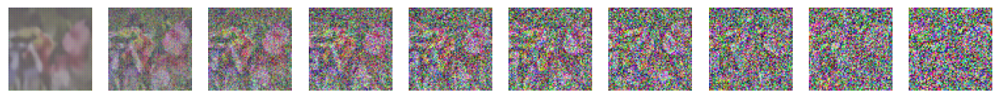

Epoch 405 | Step 000 | Loss: 0.15551631152629852


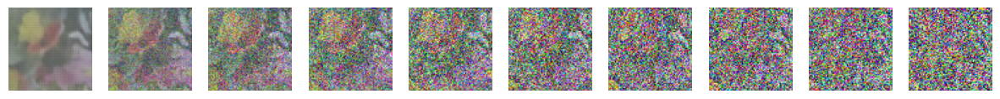

Epoch 420 | Step 000 | Loss: 0.1457202285528183


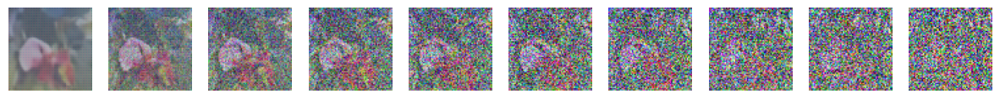

Epoch 435 | Step 000 | Loss: 0.14596639573574066


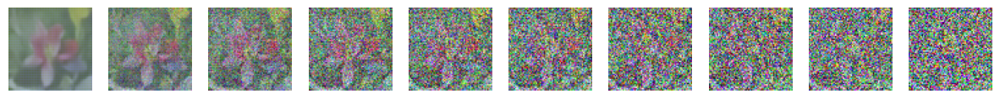

Epoch 450 | Step 000 | Loss: 0.1471702754497528


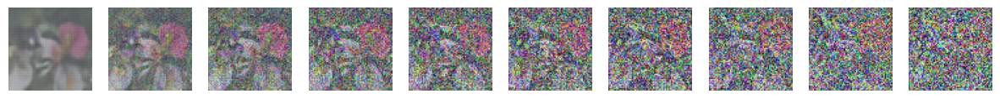

Epoch 465 | Step 000 | Loss: 0.14256112277507782


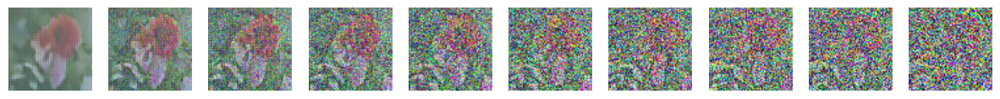

Epoch 480 | Step 000 | Loss: 0.1388578861951828


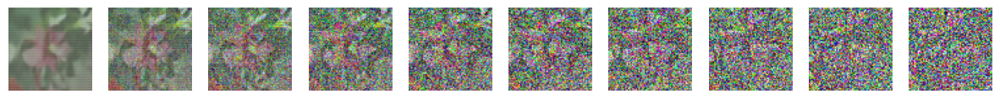

Epoch 495 | Step 000 | Loss: 0.13471397757530212


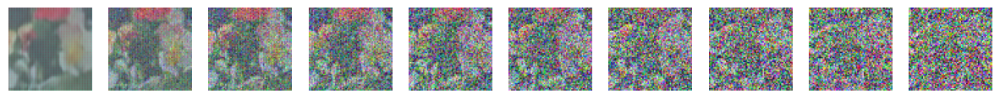

Epoch 510 | Step 000 | Loss: 0.1515582948923111


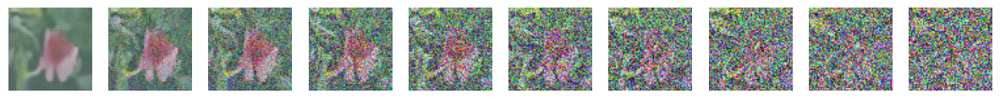

Epoch 525 | Step 000 | Loss: 0.15811380743980408


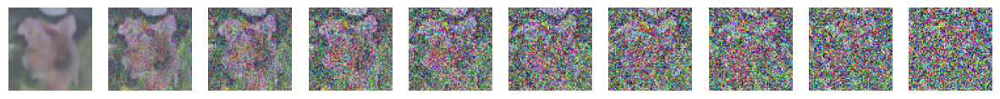

Epoch 540 | Step 000 | Loss: 0.1434434950351715


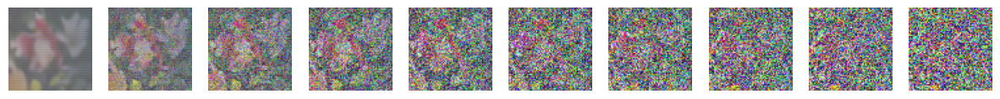

In [ ]:
import zipfile

# Set device to GPU if available, else CPU
device = "cuda" if torch.cuda.is_available() else "cpu"


# Path to the saved model weights, ! change this to the latest existing file to get latest weigths!
weight_path = "/content/epoch_200.pth"

# Load model weights if they exist
if os.path.exists(weight_path):
    model.load_state_dict(torch.load(weight_path, map_location=device))
    print(f"Loaded weights from {weight_path}")
else:
    print("Pretrained weights file does not exist, new training started")

# Move model to the appropriate device
model.to(device)

# Define the optimizer
optimizer = Adam(model.parameters(), lr=0.001)

# Number of training epochs
epochs = 2000

# Training loop
for epoch in range(epochs):
    for step, batch in enumerate(dataloader):
        # Zero the parameter gradients
        optimizer.zero_grad()

        # Move batch to device
        batch = [b.to(device) for b in batch]

        # Random timesteps for each sample in the batch
        t = torch.randint(0, T, (BATCH_SIZE,), device=device).long()

        # Compute the loss
        loss = get_loss(model, batch[0], t, device)

        # Backward pass and optimization step
        loss.backward()
        optimizer.step()

        # Print and save model at regular intervals
        if epoch % 15 == 0 and step == 0:
            print(f"Epoch {epoch} | Step {step:03d} | Loss: {loss.item()}")
            sample_plot_image(model, device)
            save_path = f"epoch_{epoch}.pth"
            torch.save(model.state_dict(), save_path)

In [ ]:
# Create a ZIP archive
zip_file_path = 'model.zip'
with zipfile.ZipFile(zip_file_path, 'w') as zipf:
    zipf.write(weight_path, os.path.basename(weight_path))
files.download(zip_file_path) # Download the saved model checkpoint